In [1]:
import numpy as np
import pandas as pd
import json
import os
import re
import scipy
import random
from collections import OrderedDict
from collections import Counter

import warnings
warnings.filterwarnings("ignore")

In [2]:
with open('homepage.json', 'r', encoding='utf-8') as file:
    maps = json.load(file)

In [4]:
table = pd.read_csv('scepitools_data.tsv',sep='\t')
table

,Tool,Platform,Citations,MainCategories,SubCategories,Description,DOI,Journal,Status,Code,...,Dependency,Baseline,Title,Methscore,Sequencingscore,Reviewscore,Preprint,Dataset,Reference,Tissue
0,scatac_poisson,Python,0,"dimensionality reduction, imputation, single-o...","single-omics integration (scATAC-seq), imputat...",A quantitative treatment of the fragment count...,10.1101/2022.05.04.490536,Preprint,Preprint,https://github.com/theislab/scatac_poisson,...,"anndata, eml, scanpy, scvi-tools, wandb",peakVI,Modeling fragment counts improves single-cell ...,10.103518,7.351020,4.992190,10.1101/2022.05.04.490536,2,"Martens LD, Fischer DS, Theis FJ, Gagneur J. M...",None
1,RA3,"R, Matlab",13,dimensionality reduction,dimensionality reduction,"A probabilistic generative model, RA3, in shor...",10.1038/s41467-021-22495-4,Nature Communications,Published,https://github.com/cuhklinlab/RA3,...,"devtools, Seurat","SCALE, Scasat, cisTopic, Cusanovich2018, snapATAC",RA3 is a reference-guided approach for epigene...,10.895618,9.664850,8.572415,10.1101/2020.06.16.155010,6,"Chen S, Yan G, Zhang W, Li J, Jiang R, Lin Z. ...",None
2,CellSpace,"R, C++",0,"dimensionality reduction, single-omics integra...","dimensionality reduction, single-omics integra...",An efficient and scalable k-mer based embeddin...,10.1101/2022.05.02.490310,Preprint,Preprint,https://github.com/zakieh-tayyebi/CellSpace,...,"biostrings, devtools, Seurat","ArchR, scBasset",Scalable sequence-informed embedding of single...,40.453765,21.032100,9.713703,10.1101/2022.05.02.490310,5,"Tayyebi Z, Pine AR, Leslie CS. Scalable sequen...",None
3,scGET-seq,None,0,dimensionality reduction,dimensionality reduction,A technique that exploits a Hybrid Transposase...,10.1101/2022.06.29.498092,Preprint,Preprint,NaN,...,Not Applicable,None,Dimensionality reduction and statistical model...,1.352082,1.802775,2.704163,10.1101/2022.06.29.498092,NaN,"de Pretis S, Cittaro D. Dimensionality reducti...",None
4,DIRECT-NET,R,3,regulatory network inference,regulatory network inference (gene-peak),"A computational method, named DIRECT-NET (Disc...",10.1126/sciadv.abl7393,Science Advances,Published,https://github.com/zhanglhbioinfor/DIRECT-NET,...,"devtools, Seurat","CloseGene, Distance, Cicero, ArchR, Spearman c...",DIRECT-NET: An efficient method to discover ci...,36.241605,19.126999,12.502033,None,4,"Zhang, L., Zhang, J., & Nie, Q.. DIRECT-NET: A...",None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,InClust+,None,0,"multi-omics integration, imputation","multi-omics integration (scRNA-seq, scATAC-seq...",We extend the inClust by adding two new module...,10.1101/2023.03.13.532376,Preprint,Preprint,NaN,...,None,None,InClust+: the multimodal version of inClust fo...,2.630515,3.774020,4.861030,10.1101/2023.03.13.532376,1.0,"Wang L, Nie R, Cai Y, Wang A, Zhang H, Zhang J...",None
549,scMinerva,Python,0,multi-omics integration,"multi-omics integration (scRNA-seq, scATAC-seq...","We propose scMinerva, an unsupervised and inte...",10.1101/2022.05.28.493838,Preprint,Preprint,https://github.com/yistyu/scMinerva,...,"pytorch, numpy, pandas","MOFA+, Conos, Seurat",scMinerva: an Unsupervised Graph Learning Fram...,8.860565,8.857547,9.460565,10.1101/2022.05.28.493838,6.0,"Yu T, Zong Y, Wang Y, Wang X, Li Y. scMinerva:...",None
550,DeepMAPS,"Python, R, Shell",0,multi-omics integration,"multi-omics integration (scRNA-seq, scATAC-seq)",We developed DeepMAPS (Deep learning-based Mul...,10.1038/s41467-023-36559-0,Nature Communications,Published,https://github.com/OSU-BMBL/deepmaps,...,pytorch,"Seurat, MOFA+, Harmony, TotalVI, GLUE",Single-cell biological network inference using...,38.422056,25.830617,13.649697,None,8.0,"Ma A, Wang X, Li J, Wang C, Xiao T, Liu Y, Che...",None
551,Matilda,Python,0,"multi-omics integration, simulation","multi-omics integration (scRNA-seq, scATAC-seq...","We present Matilda, a neural network-based mul...",10.1093/nar/gkad157,Nucleic Acids Research,P

In [6]:
table.columns

Index(['Tool', 'Platform', 'Citations', 'MainCategories', 'SubCategories',
       'Description', 'DOI', 'Journal', 'Status', 'Code', 'Added', 'Updated',
       'Maintained', 'Methodology', 'Omics', 'Date', 'License', 'Activity',
       'Responsiveness', 'DateSort', 'Stars', 'Abstract', 'Dependency',
       'Baseline', 'Title', 'Methscore', 'Sequencingscore', 'Reviewscore',
       'Preprint', 'Dataset', 'Reference', 'Tissue'],
      dtype='object')

# Across year

In [50]:
maps['Tool']

[['sequencing technology & application', '223'],
 ['dimensionality reduction', '116'],
 ['multi-omics integration', '91'],
 ['other', '73'],
 ['review', '62'],
 ['clustering', '44'],
 ['regulatory network inference', '38'],
 ['differential feature analysis', '37'],
 ['imputation', '31'],
 ['preprocessing', '19'],
 ['single-omics integration', '17'],
 ['cell type annotation', '12'],
 ['cross-omics translation', '11'],
 ['simulation', '8']]

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.ticker as ticker

In [53]:
data = {}
data['year'] = []
data['CAS'] = []
data['CIS'] = []
data['Hist'] = []
data['Meth'] = []
data['All'] = []
for i in range(len(maps['Year'])):
    data['year'].append(maps['Year'][i]['year'])
    data['CAS'].append(maps['Year'][i]['CAS'])
    data['CIS'].append(maps['Year'][i]['CIS'])
    data['Hist'].append(maps['Year'][i]['Hist'])
    data['Meth'].append(maps['Year'][i]['Meth'])
    data['All'].append(maps['Year'][i]['All'])

In [54]:
data = pd.DataFrame(data)
data

,year,CAS,CIS,Hist,Meth,All
0,2015,5,4,3,7,16
1,2016,9,8,5,17,29
2,2017,22,15,7,30,54
3,2018,48,27,13,47,96
4,2019,78,38,20,60,149
5,2020,126,51,27,79,210
6,2021,206,66,40,113,330
7,2022,343,88,53,143,506
8,2023,377,93,57,154,553


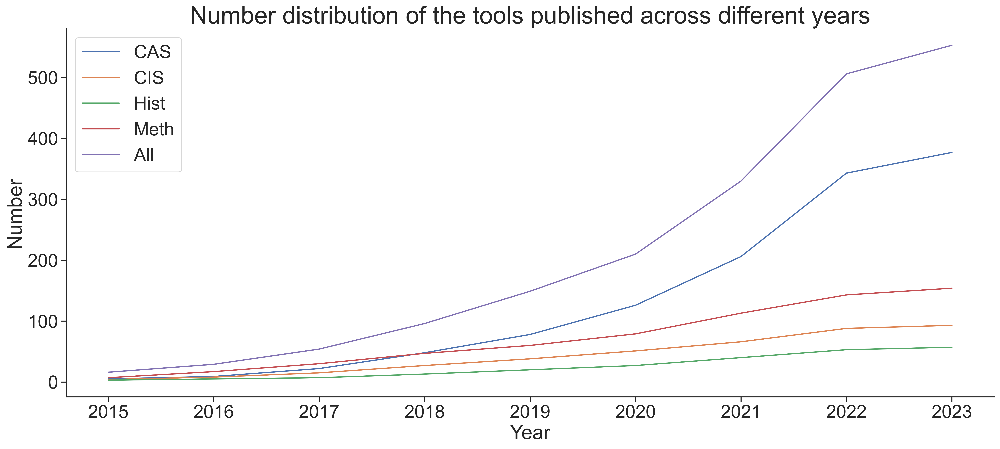

In [55]:
plt.figure(
    figsize = (20,8), 
    dpi = 500     
)
sns.set(style='ticks', font_scale=2)

for c in [i for i in data.columns if i != "year"]:
    ax = sns.lineplot(
        data=data,
        x='year',
        y=c,
        label=c,
        markers=True,
    )
    sns.despine()
    ax.set_title('Number distribution of the tools published across different years',fontsize=29)
plt.ylabel('Number')
plt.xlabel('Year')
plt.savefig('years_PLOSCB.png',dpi=350)
plt.show()

# Journal

In [84]:
data = {}
data['journal'] = []
data['number'] = []
for i in range(12):
    data['journal'].append(maps['Journal'][i]['label'])
    data['number'].append(maps['Journal'][i]['value'])

In [85]:
data = pd.DataFrame(data)
data

,journal,number
0,BioRxiv,119
1,Nature Communications,43
2,Genome Biology,36
3,Bioinformatics,30
4,Nature Biotechnology,30
5,Nature Methods,21
6,Nature,21
7,Nucleic Acids Research,18
8,Cell,15
9,Nature Genetics,14


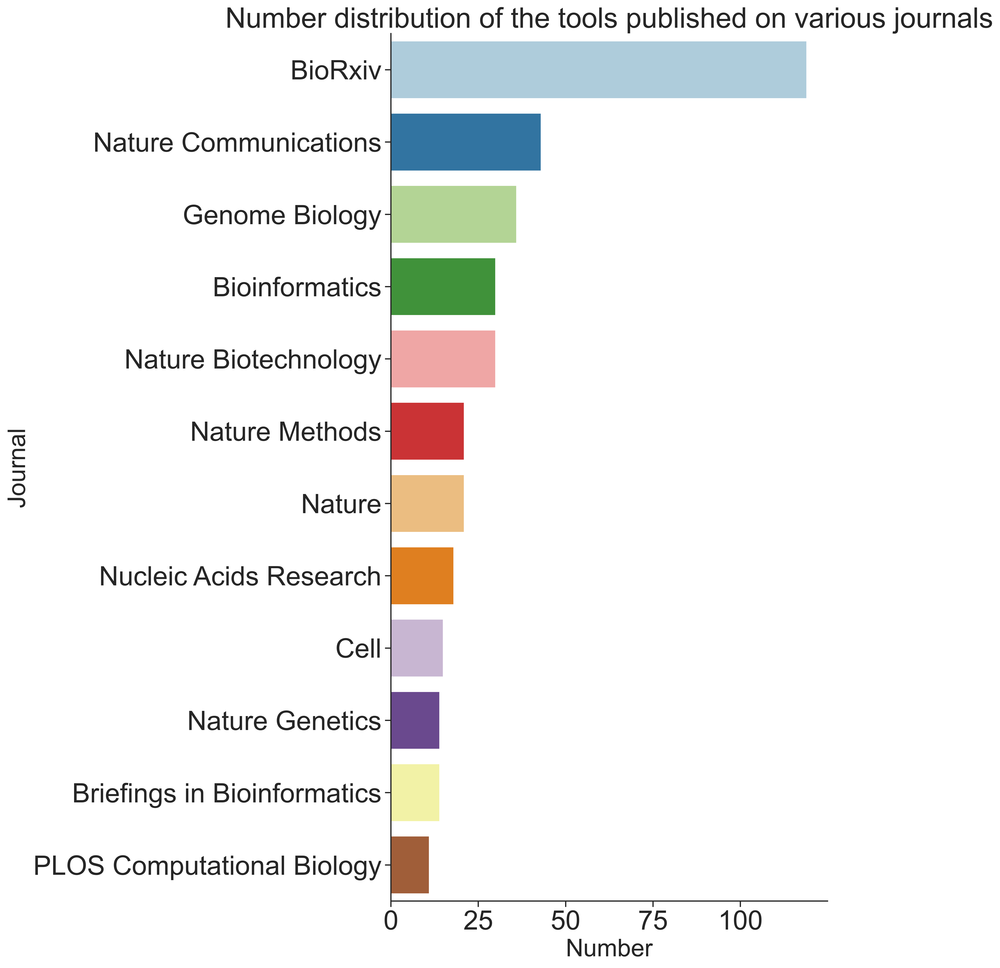

In [86]:
plt.figure(
    figsize = (8,16), 
    dpi = 500        
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
sns.barplot(y='journal',x='number',data=data)
sns.despine()
plt.ylabel('Journal',fontsize=25)
plt.xlabel('Number',fontsize=25)# 设置标题，可参考：
plt.title('Number distribution of the tools published on various journals',fontsize=29)
plt.savefig('journals.png',dpi=350,bbox_inches = 'tight')
plt.show()

# Methodology

In [11]:
all_cite = 0 
for i in range(1,len(maps['Methodology'])):
    all_cite += int(maps['Methodology'][i]['value'])
34/all_cite

0.12781954887218044

In [7]:
data = {}
data['Methodology'] = []
data['number'] = []
for i in range(13):
    data['Methodology'].append(maps['Methodology'][i]['label'].capitalize())
    data['number'].append(int(maps['Methodology'][i]['value']))

In [8]:
data = pd.DataFrame(data)

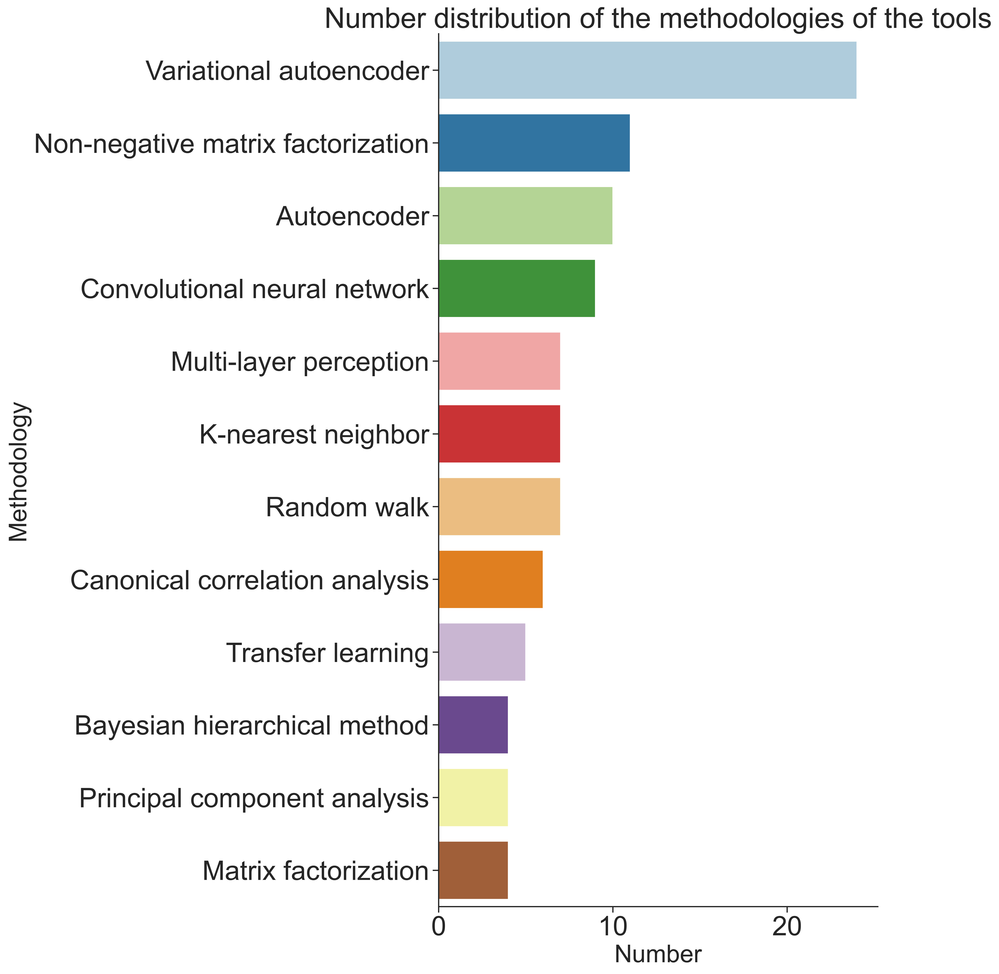

In [9]:
plt.figure(
    figsize = (8,16), 
    dpi = 500      
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
sns.barplot(y='Methodology',x='number',data=data)
sns.despine()
# plt.xticks(rotation=45)
plt.ylabel('Methodology',fontsize=25)
plt.xlabel('Number',fontsize=25)# 设置标题，可参考：
plt.title('Number distribution of the methodologies of the tools',fontsize=29)
plt.savefig('methodology.png',dpi=350,bbox_inches = 'tight')
plt.show()

# Category

In [11]:
data = {}
data['Tool'] = []
data['number'] = []
for i in range(len(maps['Tool'])):
    data['Tool'].append(maps['Tool'][i][0].capitalize())
    data['number'].append(int(maps['Tool'][i][1]))

In [12]:
data = pd.DataFrame(data)
data

,Tool,number
0,Sequencing technology & application,223
1,Dimensionality reduction,116
2,Multi-omics integration,91
3,Other,73
4,Review,62
5,Clustering,44
6,Regulatory network inference,38
7,Differential feature analysis,37
8,Imputation,31
9,Preprocessing,19


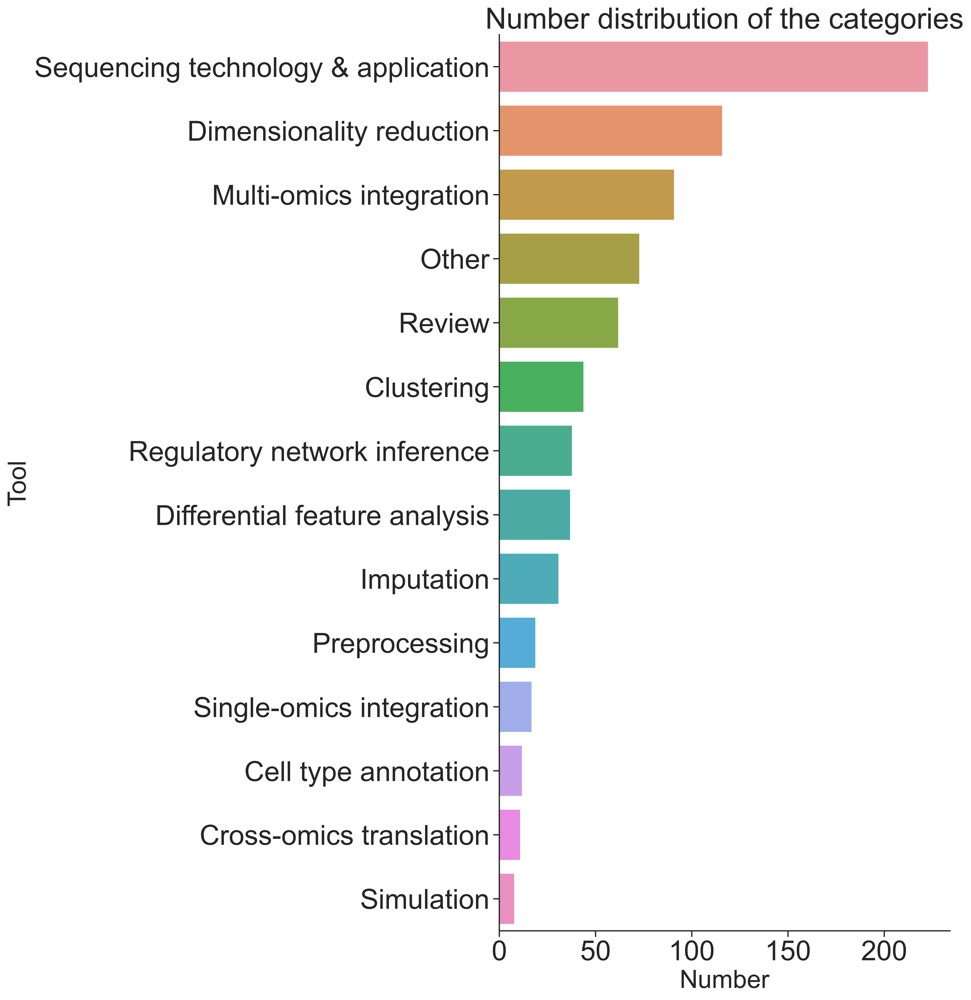

In [13]:
plt.figure(
    figsize = (8,16),
    dpi = 500    
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
sns.barplot(y='Tool',x='number',data=data)
sns.despine()
# plt.xticks(rotation=90)
plt.ylabel('Tool',fontsize=25)
plt.xlabel('Number',fontsize=25)# 设置标题，可参考：
plt.title('Number distribution of the categories',fontsize=29)
plt.savefig('tool.png',dpi=350,bbox_inches = 'tight')
plt.show()

In [31]:
all_keys = []
for i in range(14):
    all_keys.append(maps['Tool'][i][0])

['sequencing technology & application',
 'dimensionality reduction',
 'multi-omics integration',
 'other',
 'review',
 'clustering',
 'regulatory network inference',
 'differential feature analysis',
 'imputation',
 'preprocessing',
 'single-omics integration',
 'cell type annotation',
 'cross-omics translation',
 'simulation']

In [51]:
all_keys.remove('review')
all_keys.remove('sequencing technology & application')

In [47]:
all_keys = ['review','sequencing technology & application']

# Figure 2

## Citations

In [56]:
np.max(table['Citations'])
data = {}
data['Citations'] = np.log(table['Citations']+1)
data = pd.DataFrame(data)

In [61]:
np.sum(table['Citations']>20)/553

0.41229656419529837

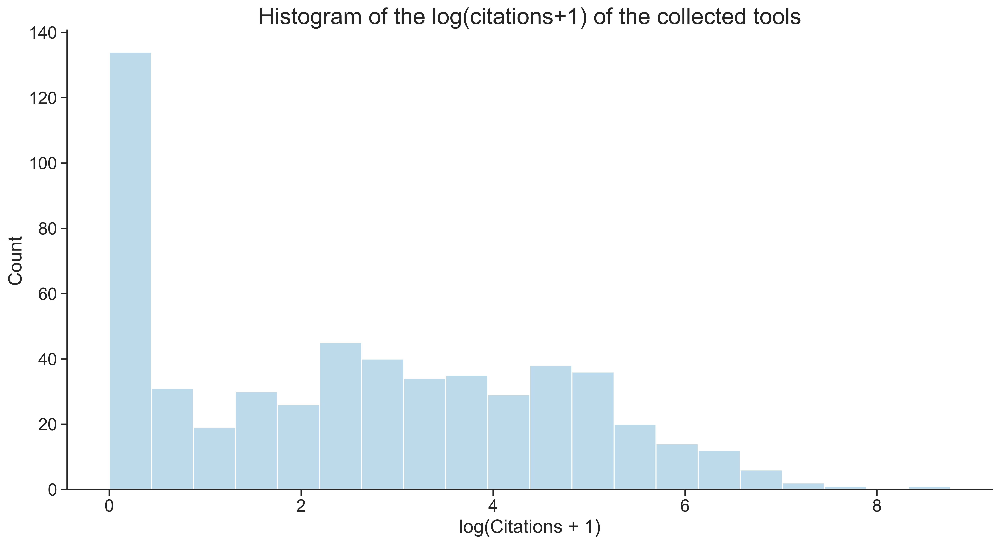

In [26]:
plt.figure(
    figsize = (16,8), 
    dpi = 500        
)
sns.set(style='ticks', font_scale=1.5,palette="Paired")
sns.histplot(x='Citations',data=data,bins=20)
sns.despine()
# plt.xticks(rotation=90)
plt.xlabel('log(Citations + 1)')
plt.title('Histogram of the log(citations+1) of the collected tools',fontsize=22)
plt.savefig('citations.png',dpi=350,bbox_inches = 'tight')
plt.show()

## publication status

In [184]:
table['Status']
numbers = 0
labels = ['Preprint','Published']
for i in range(len(table['Status'])):
    if table['Journal'].iloc[i] == 'Preprint':
        if table['Status'].iloc[i] != 'Preprint':
            print(i)
        numbers += 1
counts = [numbers,553-numbers]

In [185]:
numbers

118

In [186]:
alls = table.to_numpy()
Journal_list = []
for i in range(len(alls)):
    if alls[i,7] == 'Preprint':
        if 'arXiv' in alls[i,28]:
            Journal_list.append('arXiv')
            alls[i,7] = 'arXiv'
        else:
            Journal_list.append('BioRxiv')
            alls[i,7] = 'BioRxiv'
    else:
        Journal_list.append(alls[i,7])
Journal_dict = [{'label':count[0],'value':count[1]} for count in Counter(Journal_list).most_common()]

In [187]:
Journal_dict

[{'label': 'BioRxiv', 'value': 117},
 {'label': 'Nature Communications', 'value': 43},
 {'label': 'Genome Biology', 'value': 36},
 {'label': 'Bioinformatics', 'value': 30},
 {'label': 'Nature Biotechnology', 'value': 30},
 {'label': 'Nature Methods', 'value': 21},
 {'label': 'Nature', 'value': 21},
 {'label': 'Nucleic Acids Research', 'value': 18},
 {'label': 'Cell', 'value': 15},
 {'label': 'Nature Genetics', 'value': 14},
 {'label': 'Briefings in Bioinformatics', 'value': 14},
 {'label': 'PLOS Computational Biology', 'value': 11},
 {'label': 'Nature Protocols', 'value': 11},
 {'label': 'Genome Research', 'value': 11},
 {'label': 'Science', 'value': 10},
 {'label': 'Cell Reports', 'value': 8},
 {'label': 'Nature Reviews Genetics', 'value': 7},
 {'label': 'PNAS', 'value': 6},
 {'label': 'Cell Research', 'value': 6},
 {'label': 'Science Advances', 'value': 5},
 {'label': 'Molecular Cell', 'value': 5},
 {'label': 'Nature Machine Intelligence', 'value': 4},
 {'label': 'Trends in Genetics'

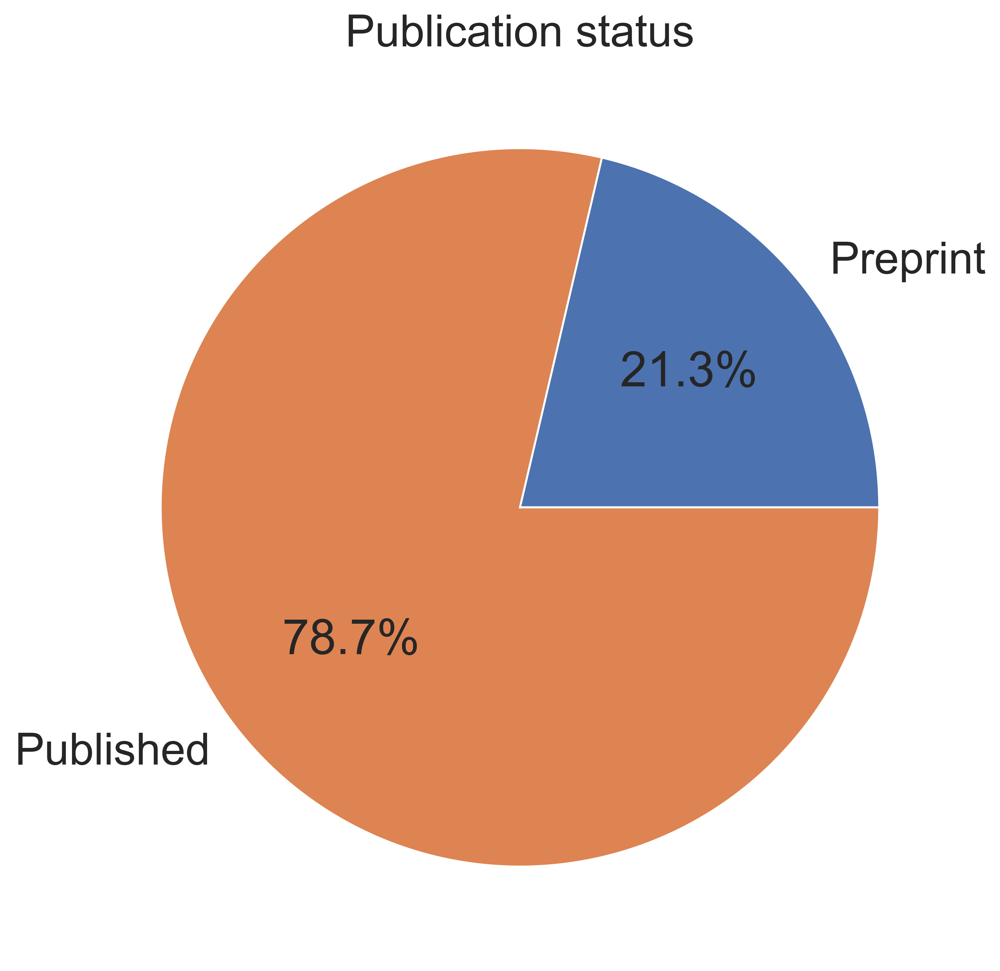

In [189]:
plt.figure(
    figsize = (8,8), 
    dpi = 500     
)
plt.pie(counts,labels=labels,autopct='%1.1f%%')
plt.title('Publication status',fontsize=22)
plt.savefig('publication_status.png',dpi=350,bbox_inches = 'tight')
plt.show()

## Omics status

In [111]:
labels = ['CAS','CIS','Hist','Meth']
counts = [377,93,57,154]

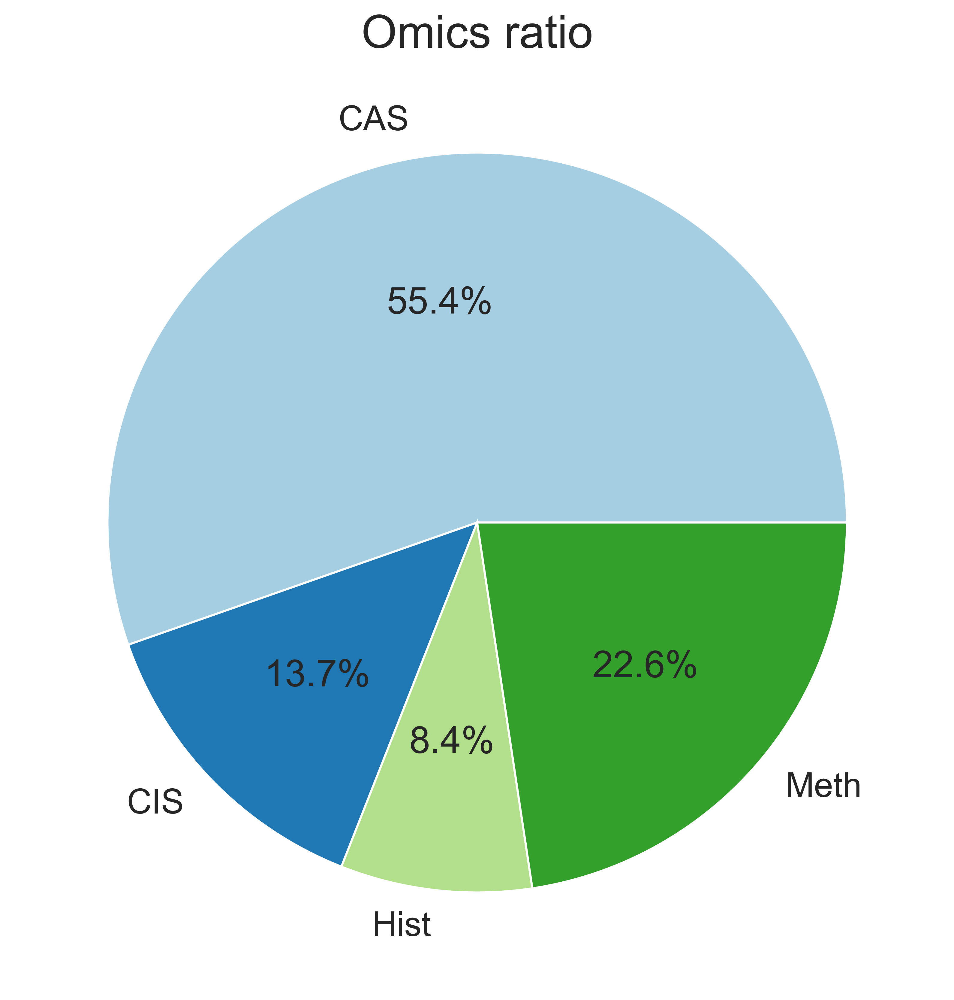

In [112]:
plt.figure(
    figsize = (8,8), 
    dpi = 500  
)
plt.pie(counts,labels=labels,autopct='%1.1f%%')
plt.title('Omics ratio',fontsize=22)
plt.savefig('Omics_status.png',dpi=350,bbox_inches = 'tight')
plt.show()

## Platforms

In [113]:
table['Platform']
data_pl = {}
for i in range(len(table['Platform'])):
    tmp_plts = table['Platform'].iloc[i].split(',')
    for plt in tmp_plts:
        plt = plt.strip()
        if plt not in data_pl.keys():
            data_pl[plt] = 1
        else:
            data_pl[plt] += 1

In [114]:
data_pl.pop('None')
data_pl.pop('Cmake')
data_pl.pop('Cpython')
data_pl

{'Python': 228,
 'R': 211,
 'Matlab': 19,
 'C++': 22,
 'Shell': 75,
 'C': 13,
 'Perl': 15,
 'Java': 4,
 'Roff': 2,
 'CMake': 1,
 'JavaScript': 1,
 'HTML': 2,
 'Limbo': 1,
 'CSS': 2}

In [116]:
data = {}
data['Platform'] = []
data['number'] = []
for i in data_pl.keys():
    data['Platform'].append(i)
    data['number'].append(np.log(data_pl[i]+1))

In [117]:
data = pd.DataFrame(data)
data

,Platform,number
0,Python,5.433722
1,R,5.356586
2,Matlab,2.995732
3,C++,3.135494
4,Shell,4.330733
5,C,2.639057
6,Perl,2.772589
7,Java,1.609438
8,Roff,1.098612
9,CMake,0.693147


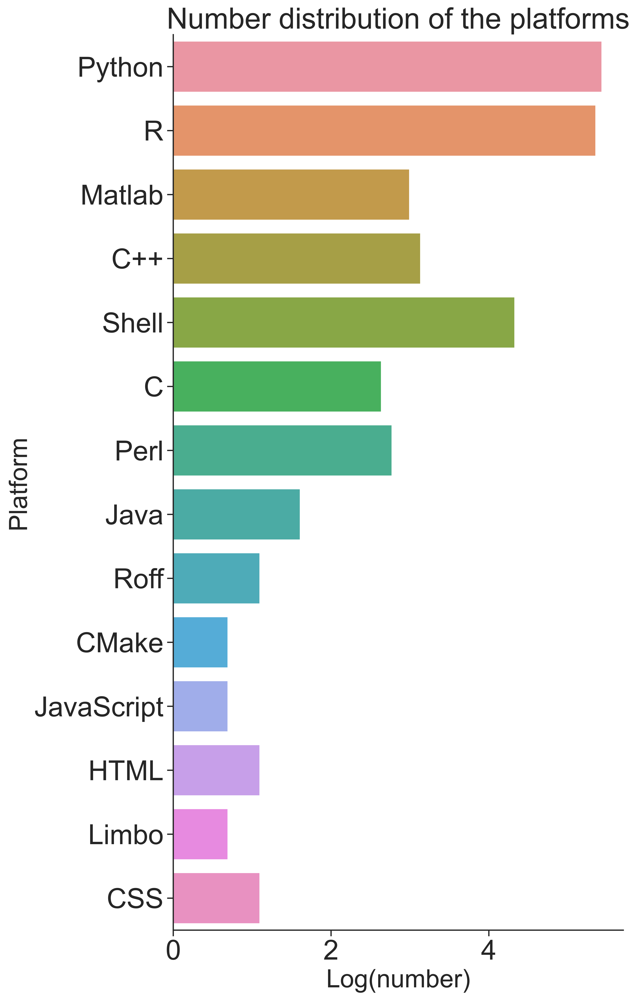

In [119]:
plt.figure(
    figsize = (8,16), 
    dpi = 500   
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
sns.barplot(y='Platform',x='number',data=data)
sns.despine()
# plt.xticks(rotation=90)
plt.ylabel('Platform',fontsize=25)
plt.xlabel('Log(number)',fontsize=25)# 设置标题，可参考：
plt.title('Number distribution of the platforms',fontsize=29)
plt.savefig('platform.png',dpi=350,bbox_inches = 'tight')
plt.show()

## License

In [129]:
table['License']
data_pl = {}
for i in range(len(table['License'])):
    tmp_plts = table['License'].iloc[i].split(',')
    for tmp_plt in tmp_plts:
        tmp_plt = tmp_plt.strip()
        if tmp_plt not in data_pl.keys():
            data_pl[tmp_plt] = 1
        else:
            data_pl[tmp_plt] += 1
data_pl

{'None': 363,
 'GPL': 22,
 'MIT': 101,
 'AGPL': 3,
 'BSD-3-Clause': 3,
 'Apache': 2,
 'LGPL': 4,
 'BSD-2-Clause': 3,
 'GNU': 1,
 'CC0': 1,
 'GPL-3': 27,
 'BSD 3-Clause': 11,
 'VIB': 1,
 'CC-BY-4': 1,
 'AGPL-3': 1,
 'GNU General Public License v3.0': 2,
 'BSD 2-Clause': 3,
 'LGPL-3': 1,
 'CC BY 3.0 US': 1,
 'View': 1,
 'Apache-2.0': 4,
 'GNU General Public License': 1,
 'Genome Research Ltd': 1}

In [130]:
data_pl.pop('None')

363

In [128]:
table['License'] = table['License'].fillna('None')

In [131]:
data_pl_manu = {
 'MIT': 101,
 'GPL': 48,
 'AGPL': 4,
 'BSD-3-Clause': 14,
 'BSD-2-Clause': 6,
 'Apache': 6,
 'LGPL': 4,
 'GNU': 4,
 'CC0': 1,
 'VIB': 1,
 'CC-BY-4': 1,
 'LGPL-3': 1,
 'CC BY 3.0 US': 1,
 'Genome Research Ltd': 1}
data_pl_manu.keys()

dict_keys(['MIT', 'GPL', 'AGPL', 'BSD-3-Clause', 'BSD-2-Clause', 'Apache', 'LGPL', 'GNU', 'CC0', 'VIB', 'CC-BY-4', 'LGPL-3', 'CC BY 3.0 US', 'Genome Research Ltd'])

In [132]:
data = {}
data['License'] = []
data['number'] = []
for i in data_pl_manu.keys():
    data['License'].append(i)
    data['number'].append(data_pl_manu[i])
data = pd.DataFrame(data)
data

,License,number
0,MIT,101
1,GPL,48
2,AGPL,4
3,BSD-3-Clause,14
4,BSD-2-Clause,6
5,Apache,6
6,LGPL,4
7,GNU,4
8,CC0,1
9,VIB,1


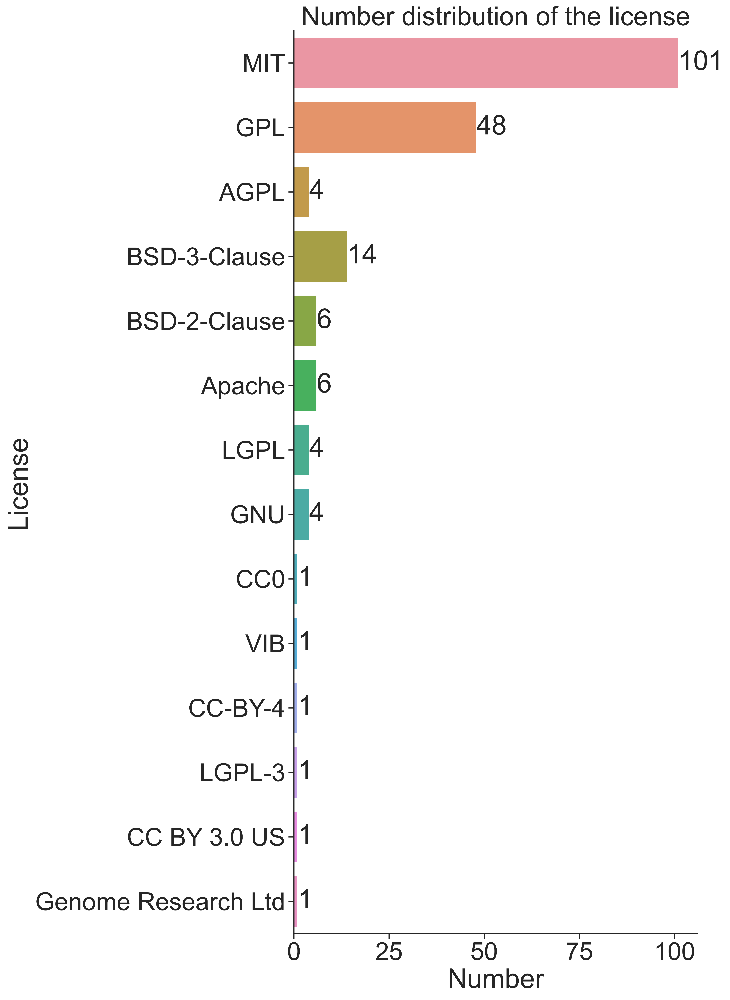

In [133]:
plt.figure(
    figsize = (8,18), 
    dpi = 500
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
g = sns.barplot(y='License',x='number',data=data)
sns.despine()
plt.bar_label(g.containers[0])

# plt.xticks(rotation=90)
plt.xlabel('Number')
plt.title('Number distribution of the license',fontsize=29)
plt.savefig('license.png',dpi=350,bbox_inches = 'tight')
plt.show()

# Github

In [26]:
table['Stars'] = table['Stars'].fillna('None')
table['Stars']

0         5
1         4
2         4
3      None
4         7
       ... 
548     0.0
549     0.0
550    21.0
551     7.0
552     0.0
Name: Stars, Length: 553, dtype: object

In [41]:
stars = []
count = 0
for i in range(len(table['Stars'])):
    if table['Stars'].iloc[i] != 'None':
#         stars.append(np.log(int(float(table['Stars'].iloc[i]))+1))
        stars.append(int(float(table['Stars'].iloc[i])))
        if int(float(table['Stars'].iloc[i]))>1000:
            count += 1

In [42]:
data = {}
data['Stars'] = stars
data = pd.DataFrame(data)

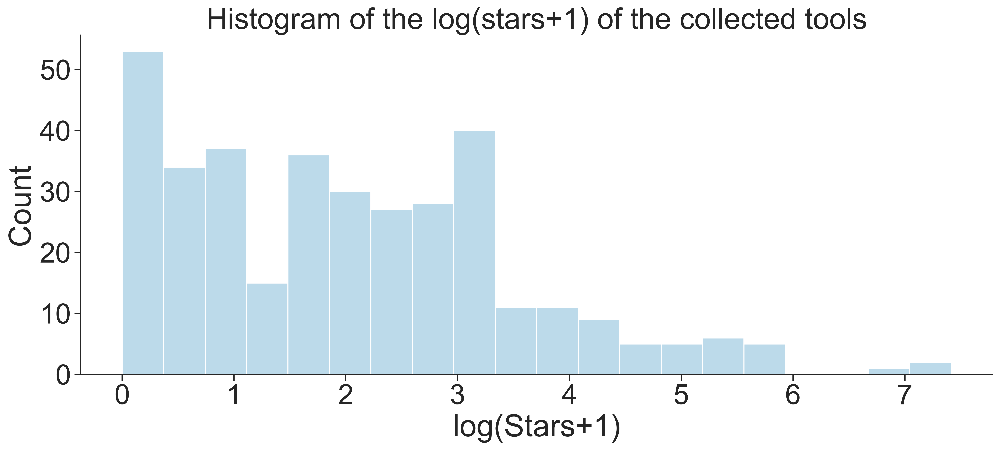

In [19]:
plt.figure(
    figsize = (16,6), 
    dpi = 500        
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
sns.histplot(x='Stars',data=data,bins=20)
sns.despine()
# plt.xticks(rotation=90)
plt.xlabel('log(Stars+1)')
plt.title('Histogram of the log(stars+1) of the collected tools',fontsize=29)
plt.savefig('stars.png',dpi=350,bbox_inches = 'tight')
plt.show()

## Activity

In [12]:
table['Activity'] = table['Activity'].fillna('None')
table['Activity']

0      0.7265693710234830
1                       0
2      0.3919690240454310
3                    None
4      0.4670479605551860
              ...        
548                   0.0
549                   0.0
550                 0.333
551                   0.0
552                   0.0
Name: Activity, Length: 553, dtype: object

In [15]:
Activity = []
for i in range(len(table['Activity'])):
    if table['Activity'].iloc[i] != 'None' and float(table['Activity'].iloc[i]) > 0 :
        Activity.append(np.log(float(table['Activity'].iloc[i])+1))

In [17]:
data = {}
data['Github Activity'] = Activity
data = pd.DataFrame(data)

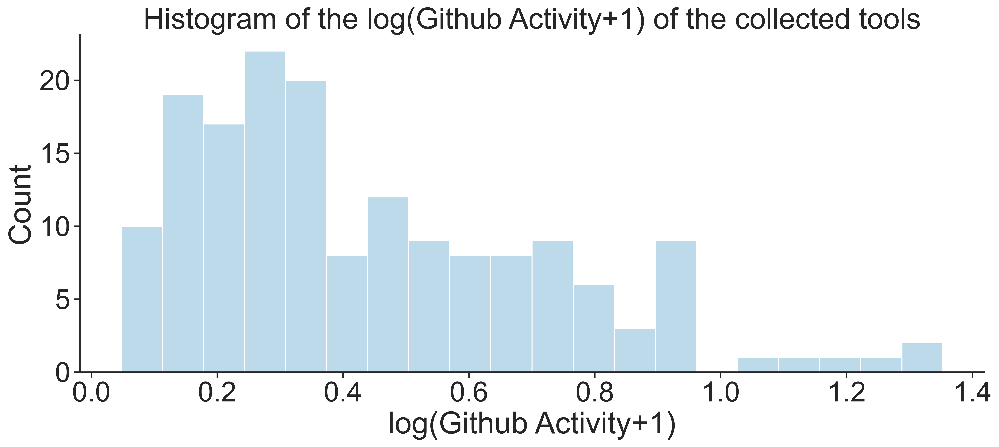

In [20]:
plt.figure(
    figsize = (16,6),
    dpi = 500     
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
sns.histplot(x='Github Activity',data=data,bins=20)
sns.despine()
# plt.xticks(rotation=90)
plt.xlabel('log(Github Activity+1)')
plt.title('Histogram of the log(Github Activity+1) of the collected tools',fontsize=29)
plt.savefig('Activity.png',dpi=350,bbox_inches = 'tight')
plt.show()

## Responsiveness

In [21]:
table['Responsiveness'] = table['Responsiveness'].fillna('None')
table['Responsiveness']

0      -137.3488541666670
1                    None
2       29.99766203703700
3                    None
4       29.55515046296300
              ...        
548                   0.0
549                   0.0
550                26.732
551                   0.0
552                   0.0
Name: Responsiveness, Length: 553, dtype: object

In [22]:
Responsiveness = []
for i in range(len(table['Responsiveness'])):
    if table['Responsiveness'].iloc[i] != 'None' and float(table['Responsiveness'].iloc[i]) > 0:
        Responsiveness.append(float(table['Responsiveness'].iloc[i]))

In [23]:
data = {}
data['Github Responsiveness'] = Responsiveness
data = pd.DataFrame(data)

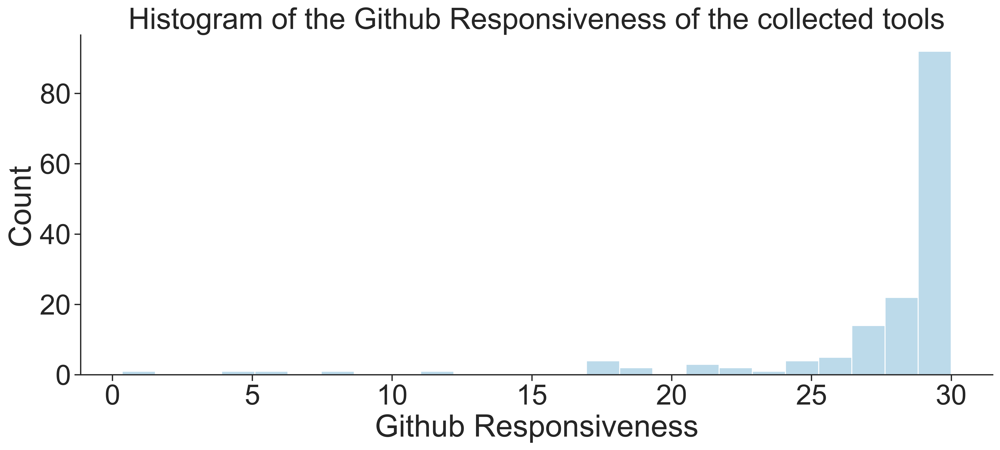

In [24]:
plt.figure(
    figsize = (16,6),
    dpi = 500       
)
sns.set(style='ticks', font_scale=2.5,palette="Paired")
sns.histplot(x='Github Responsiveness',data=data,bins=25)
sns.despine()
# plt.xticks(rotation=90)
plt.xlabel('Github Responsiveness')
plt.title('Histogram of the Github Responsiveness of the collected tools',fontsize=29)
plt.savefig('Responsiveness.png',dpi=350,bbox_inches = 'tight')
plt.show()

# Categories across years

In [27]:
table.columns

Index(['Tool', 'Platform', 'Citations', 'MainCategories', 'SubCategories',
       'Description', 'DOI', 'Journal', 'Status', 'Code', 'Added', 'Updated',
       'Maintained', 'Methodology', 'Omics', 'Date', 'License', 'Activity',
       'Responsiveness', 'DateSort', 'Stars', 'Abstract', 'Dependency',
       'Baseline', 'Title', 'Methscore', 'Sequencingscore', 'Reviewscore',
       'Preprint', 'Dataset', 'Reference', 'Tissue'],
      dtype='object')

In [29]:
table['Date'].iloc[115]

'2015.08.21'

In [37]:
dicts = {}
for key in all_keys:
    dicts[key] = []
    for i in range(2015,2024):
        count = 0
        for j in range(len(table)):
            if table['Date'].iloc[j][:4] == str(i):
                tmp_cates = table['MainCategories'].iloc[j].split(',')
                for k in range(len(tmp_cates)):
                    if k == 0:
                        tmp_cate = tmp_cates[k]
                    else:
                        tmp_cate = tmp_cates[k][1:]
                    if tmp_cate == key:
                        count += 1
        dicts[key].append(count)

In [33]:
dicts_pd = pd.DataFrame(dicts)
dicts_pd

,sequencing technology & application,dimensionality reduction,multi-omics integration,other,review,clustering,regulatory network inference,differential feature analysis,imputation,preprocessing,single-omics integration,cell type annotation,cross-omics translation,simulation
0,11,0,0,2,3,0,0,0,0,0,0,0,0,0
1,8,0,0,2,3,0,0,0,0,0,0,0,0,0
2,14,2,0,2,4,2,1,1,1,1,1,0,0,0
3,26,6,1,0,7,3,3,4,0,0,2,1,0,0
4,30,9,4,4,4,4,2,5,5,1,1,3,2,0
5,17,12,11,5,13,12,1,5,4,6,0,1,2,0
6,52,25,20,21,13,10,5,10,5,7,4,3,0,2
7,48,55,38,32,12,10,20,11,14,3,9,4,7,2
8,11,7,17,5,3,3,6,1,2,1,0,0,0,4


In [40]:
new_columns = []
for i in range(len(dicts_pd.columns)):
    new_columns.append(dicts_pd.columns[i].capitalize())
dicts_pd.columns = new_columns

In [41]:
dicts_pd

,Sequencing technology & application,Dimensionality reduction,Multi-omics integration,Other,Review,Clustering,Regulatory network inference,Differential feature analysis,Imputation,Preprocessing,Single-omics integration,Cell type annotation,Cross-omics translation,Simulation,Year
2015,11,0,0,2,3,0,0,0,0,0,0,0,0,0,2015
2016,8,0,0,2,3,0,0,0,0,0,0,0,0,0,2016
2017,14,2,0,2,4,2,1,1,1,1,1,0,0,0,2017
2018,26,6,1,0,7,3,3,4,0,0,2,1,0,0,2018
2019,30,9,4,4,4,4,2,5,5,1,1,3,2,0,2019
2020,17,12,11,5,13,12,1,5,4,6,0,1,2,0,2020
2021,52,25,20,21,13,10,5,10,5,7,4,3,0,2,2021
2022,48,55,38,32,12,10,20,11,14,3,9,4,7,2,2022
2023,11,7,17,5,3,3,6,1,2,1,0,0,0,4,2023


In [318]:
all_keys = dicts['2022'].keys()

In [42]:
dicts_pd['Year'] = [2015,2016,2017,2018,2019,2020,2021,2022,2023]

In [43]:
dicts_pd.index = [2015,2016,2017,2018,2019,2020,2021,2022,2023]

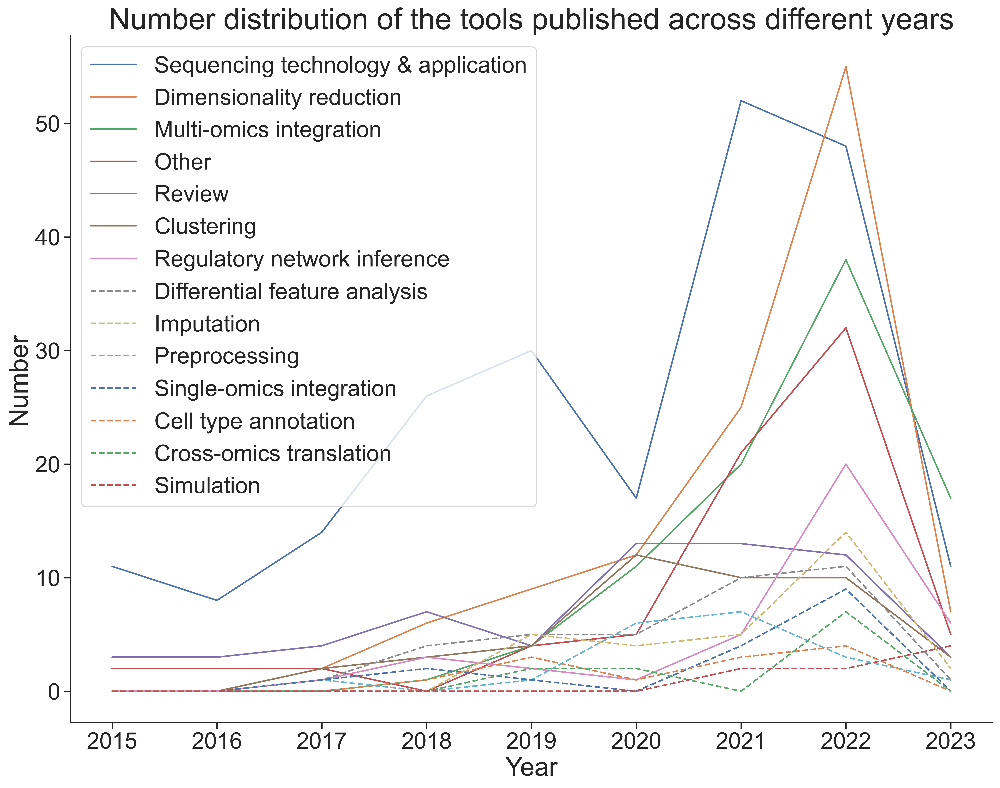

In [44]:
plt.figure(
    figsize = (16,12), 
    dpi = 500      
)
sns.set(style='ticks', font_scale=2)

count = 0
for c in [i for i in dicts_pd.columns if i != "Year"]:
    count += 1
    if count > 7:
        ax = sns.lineplot(
            data=dicts_pd,
            x='Year',
            y=c,
            label=c,
            markers=True,
            linestyle='--'
        )
    else:
        ax = sns.lineplot(
            data=dicts_pd,
            x='Year',
            y=c,
            label=c,
            markers=True
        )
    sns.despine()
    ax.set_title('Number distribution of the tools published across different years',fontsize=29)
plt.ylabel('Number',fontsize=25)
plt.xlabel('Year',fontsize=25)
plt.savefig('years_category.png',dpi=350)
plt.show()

# scEpiEnsemble

In [13]:
res_table_pd = pd.read_csv("./scEpiEnsemble.csv",index_col = 0)

In [14]:
res_table_pd

,method,cluster_key,metric,value,cluster_method
0,EpiScanpy,NaN,ARI,0.445020,louvain
1,EpiScanpy,NaN,AMI,0.614566,louvain
2,EpiScanpy,NaN,NMI,0.619106,louvain
3,EpiScanpy,NaN,Homo,0.661660,louvain
4,Signac,NaN,ARI,0.392141,louvain
5,Signac,NaN,AMI,0.574679,louvain
6,Signac,NaN,NMI,0.579810,louvain
7,Signac,NaN,Homo,0.609315,louvain
8,SnapATAC,NaN,ARI,0.447746,louvain
9,SnapATAC,NaN,AMI,0.621640,louvain


In [17]:
# sc.settings.set_figure_params(dpi=80,facecolor='white',figsize=(15,26),frameon=True,fontsize=25)
plt.figure(
    figsize = (28,6), 
    dpi = 500      
)
sns.set(style='ticks', font_scale=2.5)
g = sns.barplot( x="metric", y="value", hue="method", data=res_table_pd,palette='Paired')
g.legend(loc='center right', bbox_to_anchor=(1.66,0.9))

sns.despine()
# plt.bar_label(g.containers[0])
plt.xlabel('Value')
plt.ylabel('Metric')

plt.title('Clustering performance based on four kernels',fontsize=32)
plt.savefig('scEpiEnsemble.png',dpi=350,bbox_inches = 'tight')
plt.show()
# sns.catplot(col='cluster_method', y="metric", x="value", hue="method", data=res_table_pd,
#             palette='Paired', kind="bar", height=12, aspect=0.6, sharey=False, col_wrap=1, orient='h')
# sns.despine(top=False, right=False)

# Word cloud

In [8]:
table.Date

0      2022.05.04
1      2021.04.12
2      2022.05.02
3      2022.07.02
4      2022.06.01
          ...    
548    2023.03.14
549    2023.03.15
550    2023.02.21
551    2023.03.13
552    2023.03.17
Name: Date, Length: 553, dtype: object

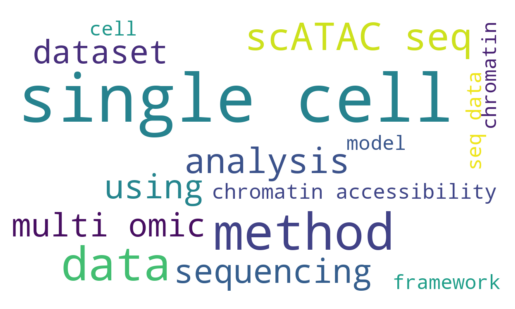

In [10]:
from wordcloud import WordCloud
table = pd.read_csv('../mysql_table/scepitools_all_20230329.tsv',sep='\t')

text = table.Description.iloc[0]
for i in [2018,2020,2023]:
    text = ''
    for k in range(len(table)):
        if table.Date.iloc[k].split('.')[0] == str(i):
            text = text + ' '+ table.Description.iloc[k]
    stopwords = set(['he', 'is','I','and','a','the','of','we','in','that','for','are','to','an','it','by','Here','from','this','at','with','can','which','single-cell','as','single cell'])
    wc = WordCloud(
        width=600,                
        height=350,                
        background_color='white',  
        stopwords=stopwords,        
        max_font_size=80,         
        min_font_size=20,        
        max_words=15,              
        scale=2
    )
    wc.generate(text)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.savefig('wordcloud_%s.png'%i,dpi=350)

#     wc.to_file('wordcloud_%s.png'%i)

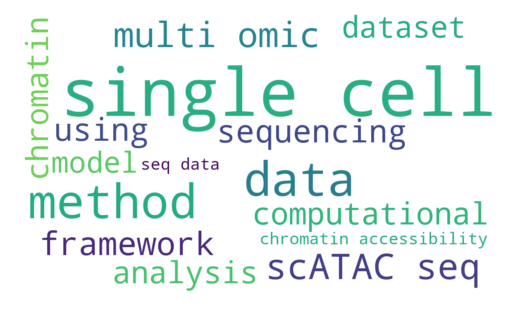

In [11]:
text = ''
for k in range(len(table)):
    if table.Date.iloc[k].split('.')[0] == '2022' or table.Date.iloc[k].split('.')[0] == '2023':
        text = text + ' '+ table.Description.iloc[k]
stopwords = set(['he', 'is','I','and','a','the','of','we','in','that','for','are','to','an','it','by','Here','from','this','at','with','can','which','single-cell','as','single cell'])
wc = WordCloud(
    width=600,                
    height=350,               
    background_color='white',   
    stopwords=stopwords,        
    max_font_size=80,         
    min_font_size=20,         
    max_words=15,              
    scale=2
)
wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud_%s.png'%i,dpi=350)
